In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Dataset2/main/temperature.csv')
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


# check for missing values

In [3]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [4]:
for i in df.columns:
    print(df[i].value_counts())
    print('\n')

1.0     310
14.0    310
24.0    310
23.0    310
22.0    310
21.0    310
20.0    310
19.0    310
18.0    310
17.0    310
16.0    310
15.0    310
13.0    310
2.0     310
12.0    310
11.0    310
10.0    310
9.0     310
8.0     310
7.0     310
6.0     310
5.0     310
4.0     310
3.0     310
25.0    310
Name: station, dtype: int64


30-06-2013    25
18-07-2016    25
25-07-2016    25
24-07-2016    25
23-07-2016    25
              ..
09-08-2014    25
08-08-2014    25
07-08-2014    25
06-08-2014    25
30-08-2017    25
Name: Date, Length: 310, dtype: int64


31.4    112
29.4    111
29.1    108
29.7    107
31.9    105
       ... 
36.9      1
21.2      1
20.1      1
36.4      1
20.3      1
Name: Present_Tmax, Length: 167, dtype: int64


24.0    161
23.8    153
23.1    144
23.5    143
23.3    142
       ... 
13.6      1
14.2      1
29.1      1
29.7      1
15.0      1
Name: Present_Tmin, Length: 155, dtype: int64


19.794666    2
71.658089    2
77.030350    2
98.524734    2
51.810596    2
        

In [5]:
#let us check for any strange values
df.isin(['NA',' ','-','NaN']).sum().any(axis=0)

False

In [6]:
#now let us find the percentage of missing values
missing = df.isnull().sum().sort_values(ascending=False)
percentage = (missing/len(df))*100
perce=pd.DataFrame()
perce['no of missing values'] = missing
perce['percentage of missing values %'] = percentage
perce

,no of missing values,percentage of missing values %
LDAPS_CC3,75,0.967492
LDAPS_PPT4,75,0.967492
LDAPS_PPT2,75,0.967492
LDAPS_PPT1,75,0.967492
LDAPS_CC4,75,0.967492
LDAPS_CC2,75,0.967492
LDAPS_CC1,75,0.967492
LDAPS_LH,75,0.967492
LDAPS_WS,75,0.967492
LDAPS_Tmin_lapse,75,0.967492


We notice from above that the maximum percentage of missing values in data set are less than 1 % so it will not imply any affect on our data insights or processing so we will DROP them

In [7]:
df.dropna(inplace=True)

In [8]:
df.shape

(7588, 25)

In [9]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

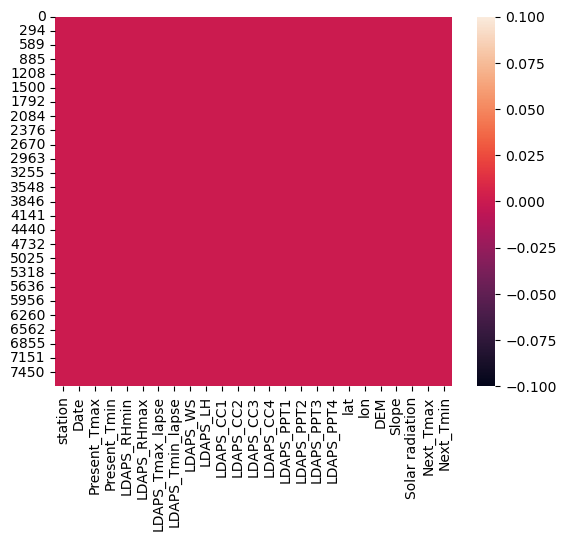

In [10]:
sns.heatmap(df.isnull())
plt.show()

There are no missing values so we can move ahead

# Statistical analysis

In [11]:
#check for duplicates
df.duplicated().sum()

0

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7588 entries, 0 to 7749
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7588 non-null   float64
 1   Date              7588 non-null   object 
 2   Present_Tmax      7588 non-null   float64
 3   Present_Tmin      7588 non-null   float64
 4   LDAPS_RHmin       7588 non-null   float64
 5   LDAPS_RHmax       7588 non-null   float64
 6   LDAPS_Tmax_lapse  7588 non-null   float64
 7   LDAPS_Tmin_lapse  7588 non-null   float64
 8   LDAPS_WS          7588 non-null   float64
 9   LDAPS_LH          7588 non-null   float64
 10  LDAPS_CC1         7588 non-null   float64
 11  LDAPS_CC2         7588 non-null   float64
 12  LDAPS_CC3         7588 non-null   float64
 13  LDAPS_CC4         7588 non-null   float64
 14  LDAPS_PPT1        7588 non-null   float64
 15  LDAPS_PPT2        7588 non-null   float64
 16  LDAPS_PPT3        7588 non-null   float64


we see from above that column Date is containg bject data so we will convert it

In [13]:
df['Date'] = pd.to_datetime(df['Date'] , format='%d-%m-%Y')

In [14]:
df['day'] = df['Date'].dt.day
df['month'] = df['Date'].dt.month
df['year'] = df['Date'].dt.year

In [15]:
df.head(3)

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,day,month,year
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30,6,2013
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30,6,2013
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,30,6,2013


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7588 entries, 0 to 7749
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7588 non-null   float64       
 1   Date              7588 non-null   datetime64[ns]
 2   Present_Tmax      7588 non-null   float64       
 3   Present_Tmin      7588 non-null   float64       
 4   LDAPS_RHmin       7588 non-null   float64       
 5   LDAPS_RHmax       7588 non-null   float64       
 6   LDAPS_Tmax_lapse  7588 non-null   float64       
 7   LDAPS_Tmin_lapse  7588 non-null   float64       
 8   LDAPS_WS          7588 non-null   float64       
 9   LDAPS_LH          7588 non-null   float64       
 10  LDAPS_CC1         7588 non-null   float64       
 11  LDAPS_CC2         7588 non-null   float64       
 12  LDAPS_CC3         7588 non-null   float64       
 13  LDAPS_CC4         7588 non-null   float64       
 14  LDAPS_PPT1        7588 n

We have created columns of day , month , year for more insights so no need for data column now

In [17]:
df.drop('Date' , axis=1, inplace=True)

In [18]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,day,month,year
count,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,...,7588.000000,7588.00000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000
mean,13.014101,29.748366,23.195809,56.724969,88.360823,29.620128,23.511786,7.094097,62.492606,0.368510,...,37.544792,126.99142,61.918136,1.259755,5343.724208,30.241526,22.910820,15.939510,7.465999,2014.991697
std,7.217858,2.967401,2.400880,14.626559,7.199456,2.943496,2.342579,2.177034,33.686158,0.262260,...,0.050428,0.07922,54.323529,1.372748,429.782561,3.111807,2.482256,8.906521,0.528635,1.410877
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,37.456200,126.82600,12.370000,0.098500,4329.520508,17.400000,11.300000,1.000000,6.000000,2013.000000
25%,7.000000,27.800000,21.600000,45.960243,84.203724,27.673756,22.086820,5.675358,37.206201,0.146546,...,37.510200,126.93700,28.700000,0.271300,5001.485717,28.200000,21.300000,8.000000,7.000000,2014.000000
50%,13.000000,29.900000,23.400000,55.023199,89.784122,29.709537,23.758249,6.547838,56.898324,0.315706,...,37.550700,126.99500,45.716000,0.618000,5441.987305,30.400000,23.100000,16.000000,7.000000,2015.000000
75%,19.000000,32.000000,24.800000,67.115099,93.742725,31.711109,25.155660,8.028960,84.235666,0.574174,...,37.577600,127.04200,59.832400,1.767800,5729.485840,32.600000,24.600000,24.000000,8.000000,2016.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,37.645000,127.13500,212.335000,5.178200,5992.895996,38.900000,29.800000,31.000000,8.000000,2017.000000


we summerize that:
- all columns are the same set shape
- columns are skewed as there is difference between mean and median(50%)
- There are outliers in some columns with continuous data as the difference between 75% value and maximum value

# Data Visualization

In [19]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'day', 'month', 'year'],
      dtype='object')

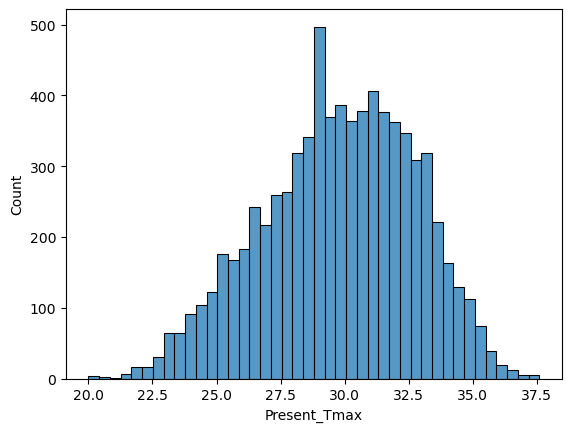

In [20]:
sns.histplot(x= df['Present_Tmax'])
plt.show()

most of maximum present temperatures are between 27.3 and 30 Â°C

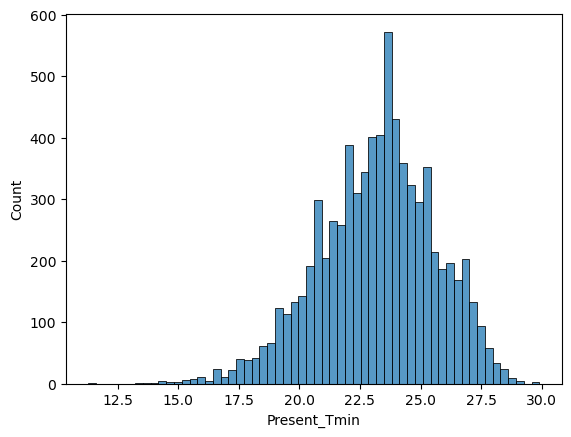

In [21]:
sns.histplot(x= df['Present_Tmin'])
plt.show()

most of minimum present temperatures are between 22.5 and 25 Â°C

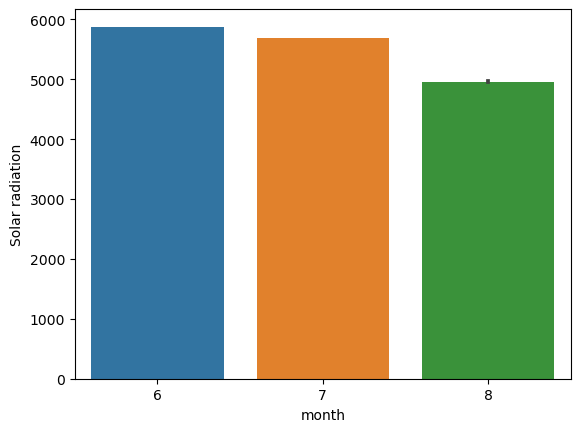

In [22]:
sns.barplot(x=df['month'] , y=df['Solar radiation'])
plt.show()

June month is the highest month that has Daily incoming solar radiation

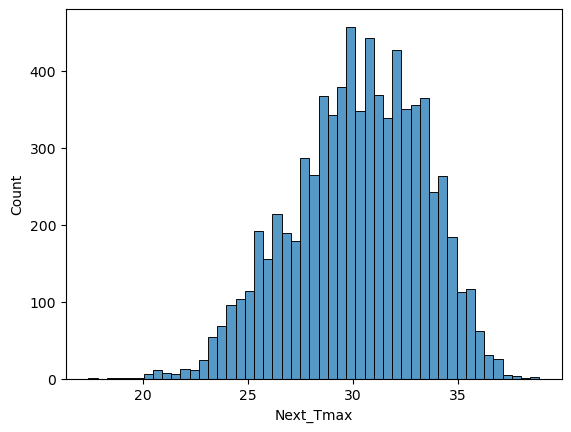

In [23]:
sns.histplot(x= df['Next_Tmax'])
plt.show()

The majority of next day maximum temperatures are between 30 to 35 Â°C

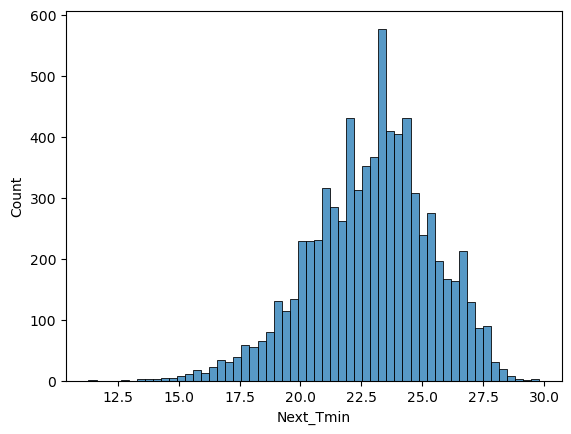

In [24]:
sns.histplot(x= df['Next_Tmin'])
plt.show()

The majority of next day minimum temperatures are between 22.5 to 25 Â°C

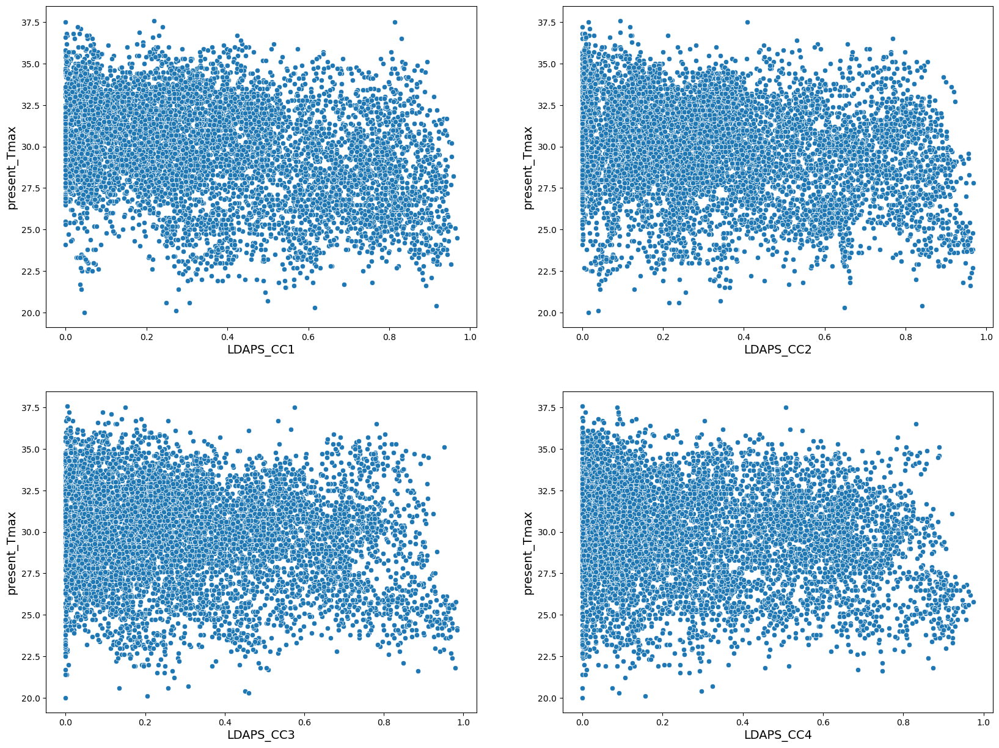

In [25]:
plt.figure(figsize=(20,15))
plotnum = 1
cols = ['LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4']
for i in cols :
    if plotnum <= 4:
        ax = plt.subplot(2,2,plotnum)
        sns.scatterplot(x=df[i] , y=df['Present_Tmax'])
        plt.xlabel(i , fontsize=14)
        plt.ylabel('present_Tmax' , fontsize=14)
    plotnum +=1
plt.show()    

There is significant relation between present maximun temperature and cloud cover average

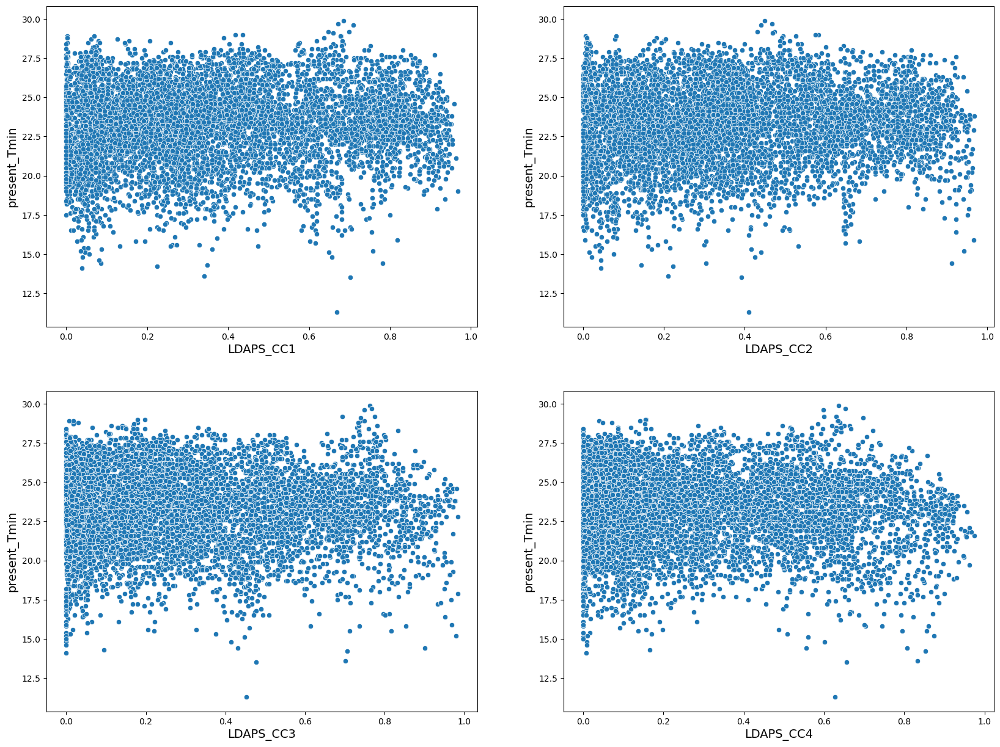

In [26]:
plt.figure(figsize=(20,15))
plotnum = 1
cols = ['LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4']
for i in cols :
    if plotnum <= 4:
        ax = plt.subplot(2,2,plotnum)
        sns.scatterplot(x=df[i] , y=df['Present_Tmin'])
        plt.xlabel(i , fontsize=14)
        plt.ylabel('present_Tmin' , fontsize=14)
    plotnum +=1
plt.show()    

There is significant relation between present maximun temperature and cloud cover average

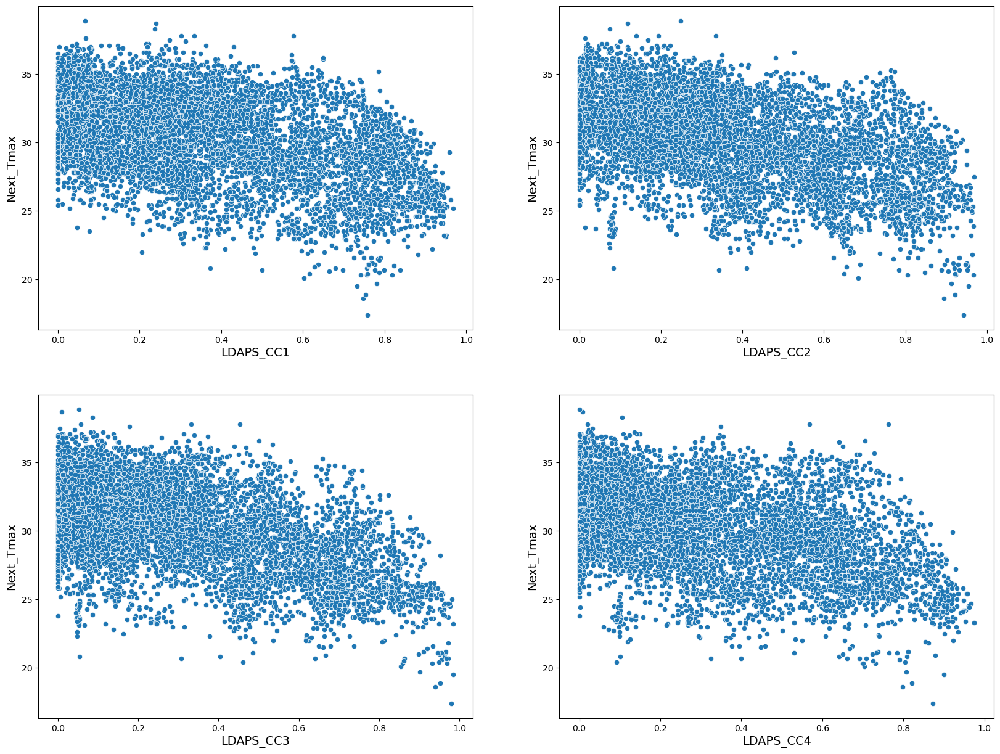

In [27]:
plt.figure(figsize=(20,15))
plotnum = 1
cols = ['LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4']
for i in cols :
    if plotnum <= 4:
        ax = plt.subplot(2,2,plotnum)
        sns.scatterplot(x=df[i] , y=df['Next_Tmax'])
        plt.xlabel(i , fontsize=14)
        plt.ylabel('Next_Tmax' , fontsize=14)
    plotnum +=1
plt.show()    

Every 6 hours in day the maximum next day maximum is forecasted to decrease when cloud cover increases

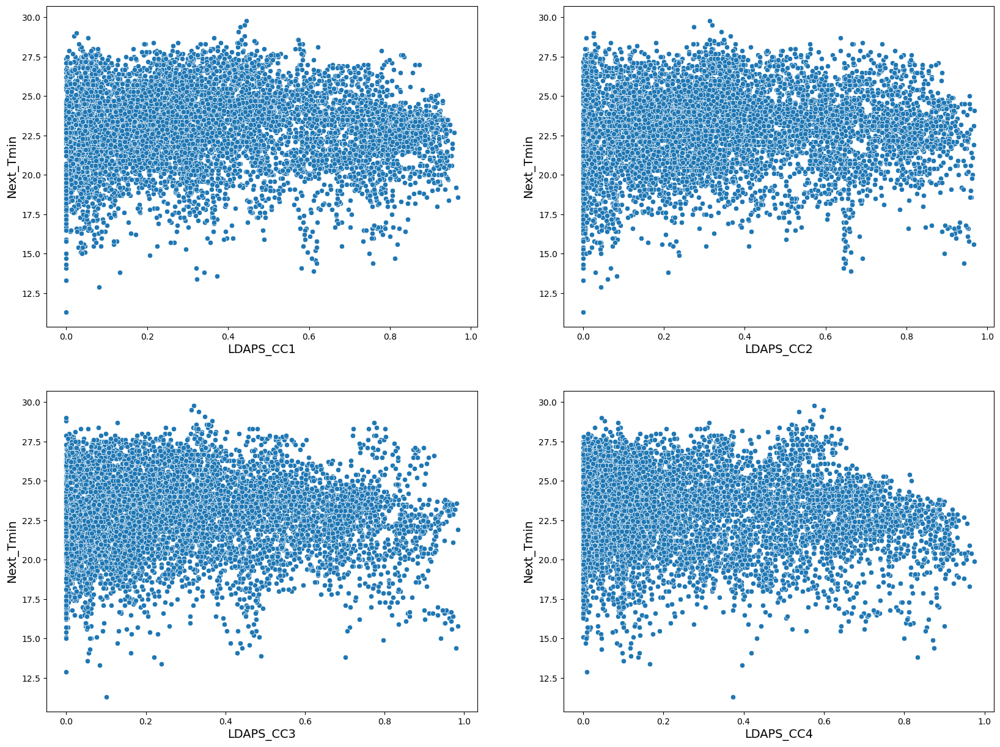

In [28]:
plt.figure(figsize=(20,15))
plotnum = 1
cols = ['LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4']
for i in cols :
    if plotnum <= 4:
        ax = plt.subplot(2,2,plotnum)
        sns.scatterplot(x=df[i] , y=df['Next_Tmin'])
        plt.xlabel(i , fontsize=14)
        plt.ylabel('Next_Tmin' , fontsize=14)
    plotnum +=1
plt.show()    

There is significant relation between next day minimun temperature and cloud cover average

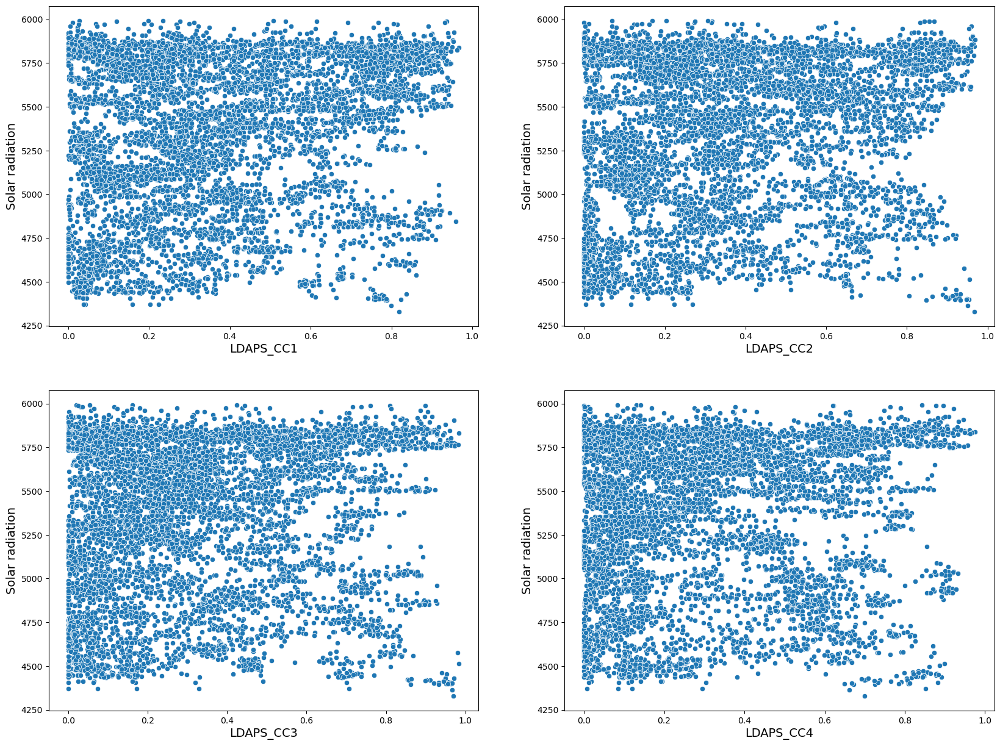

In [29]:
plt.figure(figsize=(20,15))
plotnum = 1
cols = ['LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4']
for i in cols :
    if plotnum <= 4:
        ax = plt.subplot(2,2,plotnum)
        sns.scatterplot(x=df[i] , y=df['Solar radiation'])
        plt.xlabel(i , fontsize=14)
        plt.ylabel('Solar radiation' , fontsize=14)
    plotnum +=1
plt.show()    

Daily incoming solar radiation is the highest when the cloud cover is above 0.8

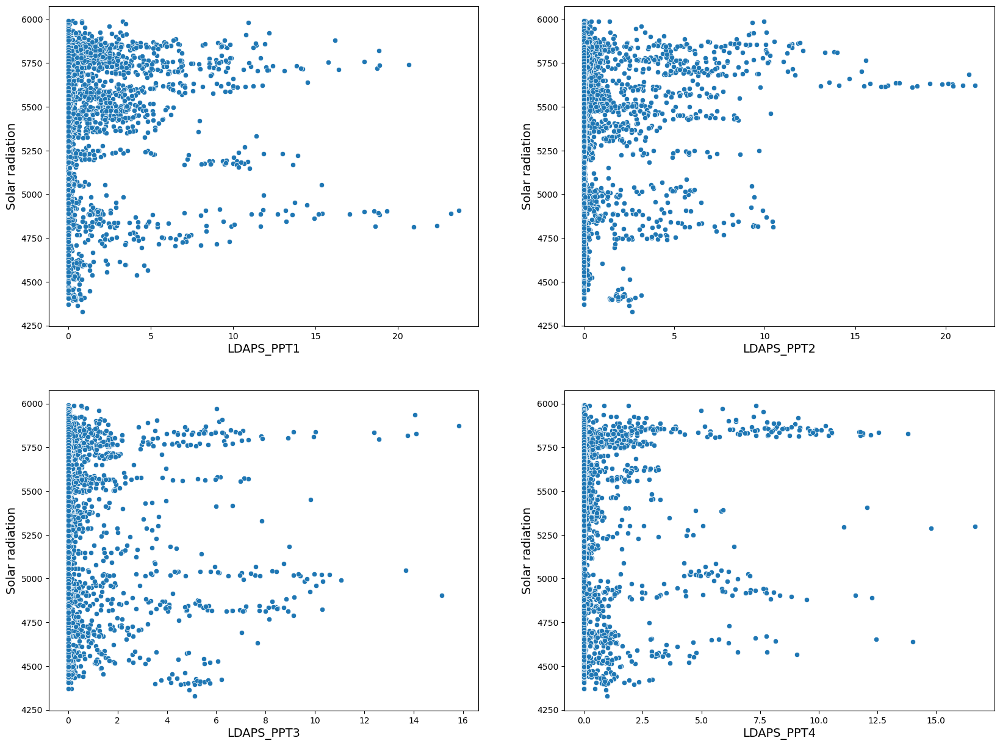

In [30]:
plt.figure(figsize=(20,15))
plotnum = 1
cols = ['LDAPS_PPT1','LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']
for i in cols :
    if plotnum <= 4:
        ax = plt.subplot(2,2,plotnum)
        sns.scatterplot(x=df[i] , y=df['Solar radiation'])
        plt.xlabel(i , fontsize=14)
        plt.ylabel('Solar radiation' , fontsize=14)
    plotnum +=1
plt.show()    

- when solar radiation is above 5000 wh/m2 , the precipitation increses above 8 which mean higher average cloud cover with cloudy atmosphere

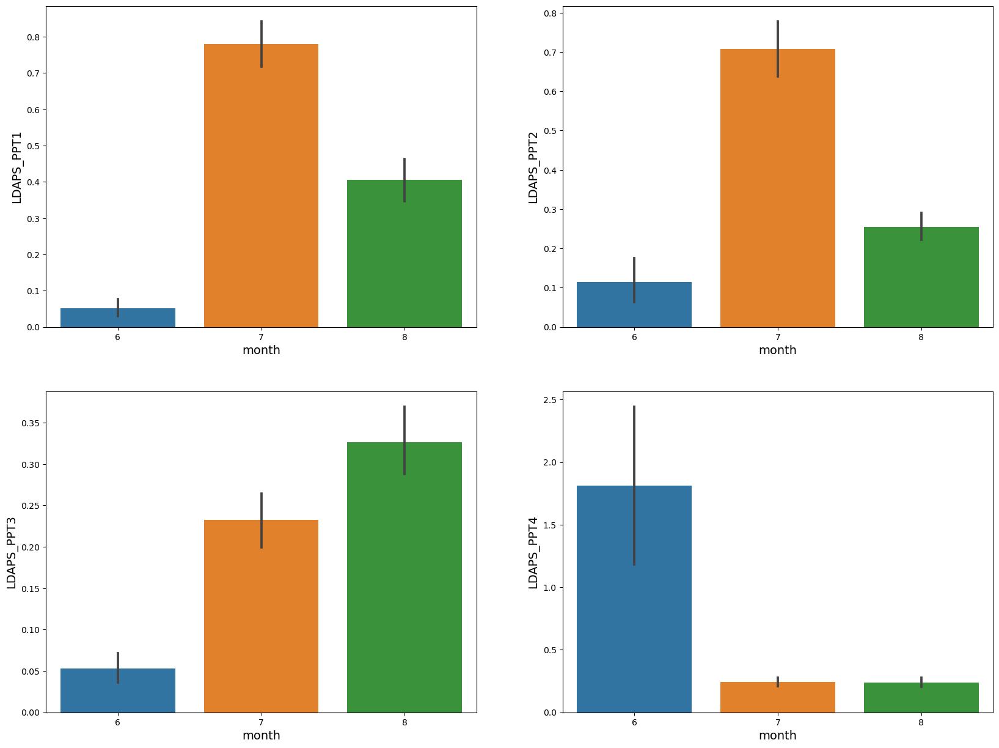

In [31]:
plt.figure(figsize=(20,15))
plotnum = 1
cols = ['LDAPS_PPT1','LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']
for i in cols :
    if plotnum <= 4:
        ax = plt.subplot(2,2,plotnum)
        sns.barplot(x=df['month'] , y=df[i])
        plt.xlabel('month' , fontsize=14)
        plt.ylabel(i , fontsize=14)
    plotnum +=1
plt.show()    

- july is the high precipitation in the 1st quarter of day
- july is the high precipitation in the 2nd quarter of day
- August the high precipitation in the 3rd quarter of day
- June is the highest precipitation in the 4th quarter of day

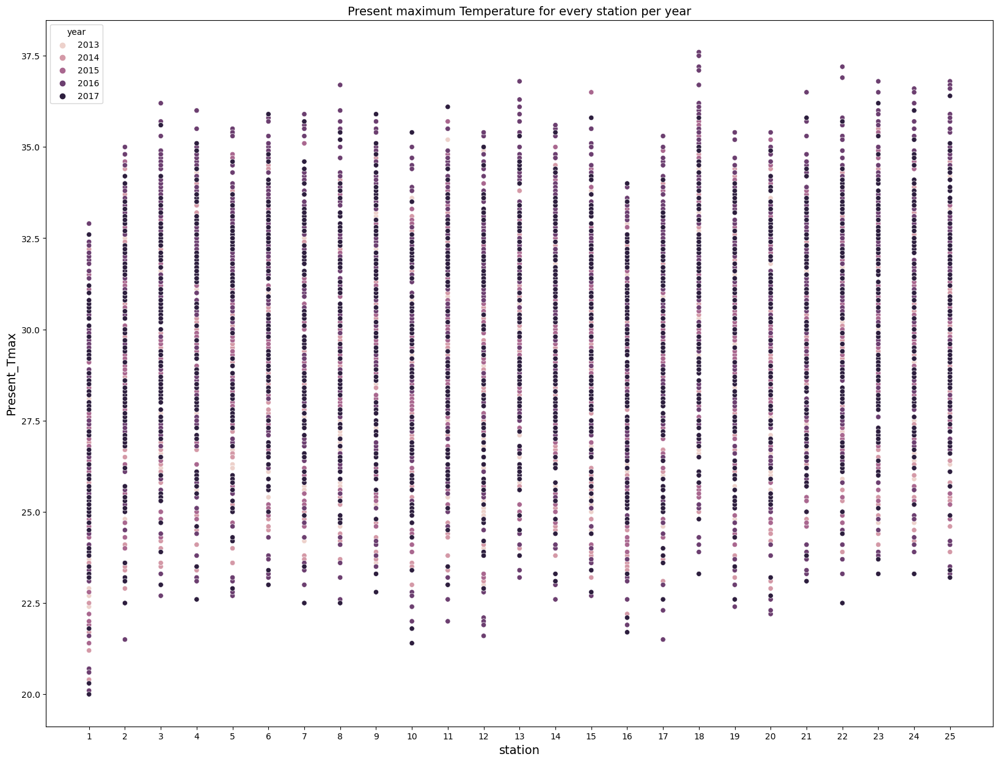

In [32]:
plt.figure(figsize=(20,15))
sns.scatterplot(x=df['station'] , y=df['Present_Tmax'] , hue=df['year'])
plt.title('Present maximum Temperature for every station per year' , fontsize=14)
plt.xticks(np.arange(1,26,1))
plt.xlabel('station', fontsize=14)
plt.ylabel('Present_Tmax', fontsize=14)
plt.show()

- station 18 has the highest present maximum temperature over all year
- statin 1 has least present maximum temperature over all year which means the coolest over all years
- 2017 is the coolest year according to station 1
- 2016 is the hottest year according to station 18

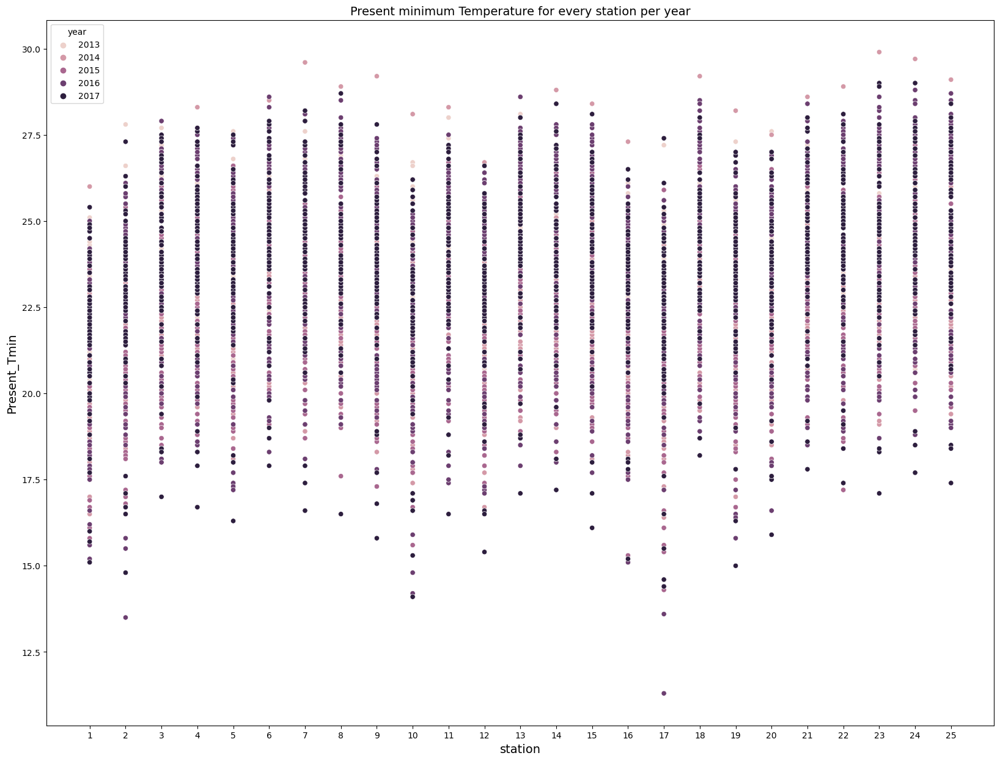

In [33]:
plt.figure(figsize=(20,15))
sns.scatterplot(x=df['station'] , y=df['Present_Tmin'] , hue=df['year'])
plt.title('Present minimum Temperature for every station per year' , fontsize=14)
plt.xticks(np.arange(1,26,1))
plt.xlabel('station', fontsize=14)
plt.ylabel('Present_Tmin', fontsize=14)
plt.show()

- station 23 has the highest present minimum temperature over all year
- statin 17 has least present minimum temperature over all year which means the coolest over all years
- 2016 is the coolest year according to station 17
- 2014 is the hottest year according to station 23

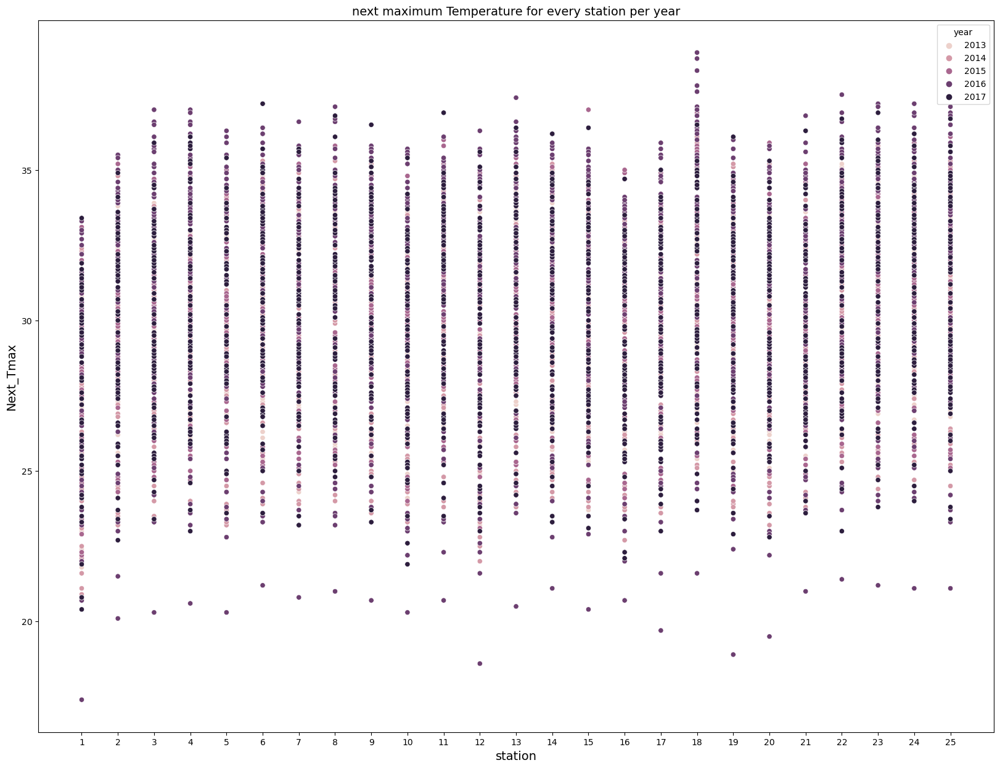

In [34]:
plt.figure(figsize=(20,15))
sns.scatterplot(x=df['station'] , y=df['Next_Tmax'] , hue=df['year'])
plt.title('next maximum Temperature for every station per year' , fontsize=14)
plt.xticks(np.arange(1,26,1))
plt.xlabel('station', fontsize=14)
plt.ylabel('Next_Tmax', fontsize=14)
plt.show()

- station 18 has the highest next maximum temperature over all year
- statin 1 has least next maximum temperature over all year which means the coolest over all years
- 2017 is the coolest year according to station 1
- 2016 is the hottest year according to station 18

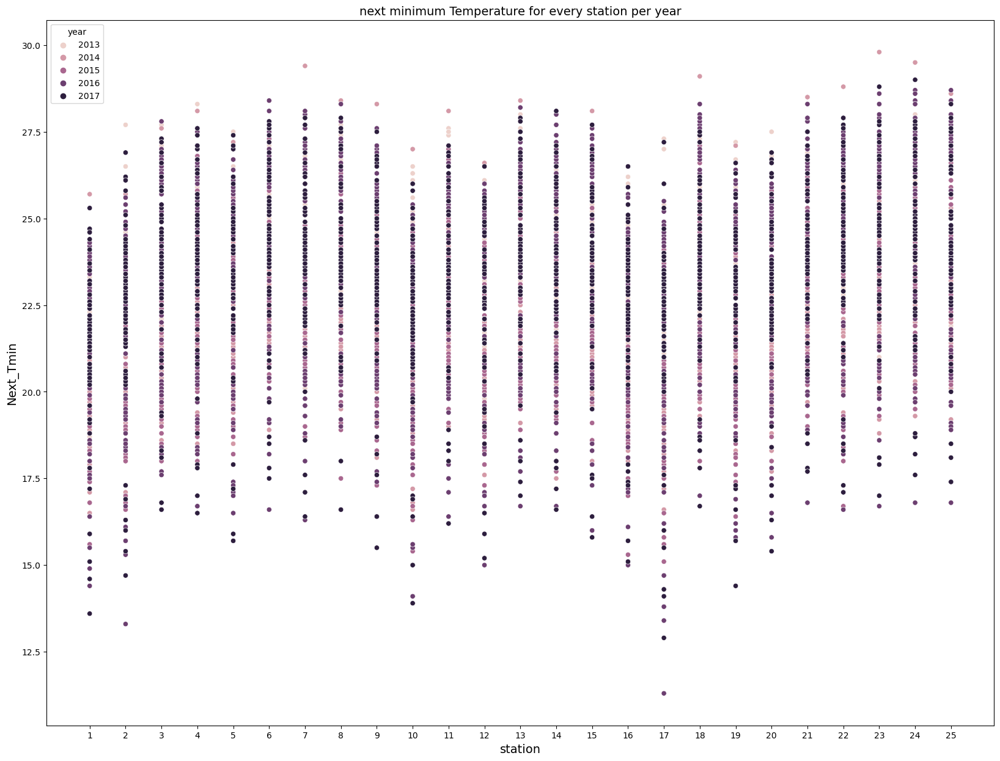

In [35]:
plt.figure(figsize=(20,15))
sns.scatterplot(x=df['station'] , y=df['Next_Tmin'] , hue=df['year'])
plt.title('next minimum Temperature for every station per year' , fontsize=14)
plt.xticks(np.arange(1,26,1))
plt.xlabel('station', fontsize=14)
plt.ylabel('Next_Tmin', fontsize=14)
plt.show()

- station 23 has the highest next minimum temperature over all year
- statin 17 has least next minimum temperature over all year which means the coolest over all years
- 2016 is the coolest year according to station 17
- 2014 is the hottest year according to station 23

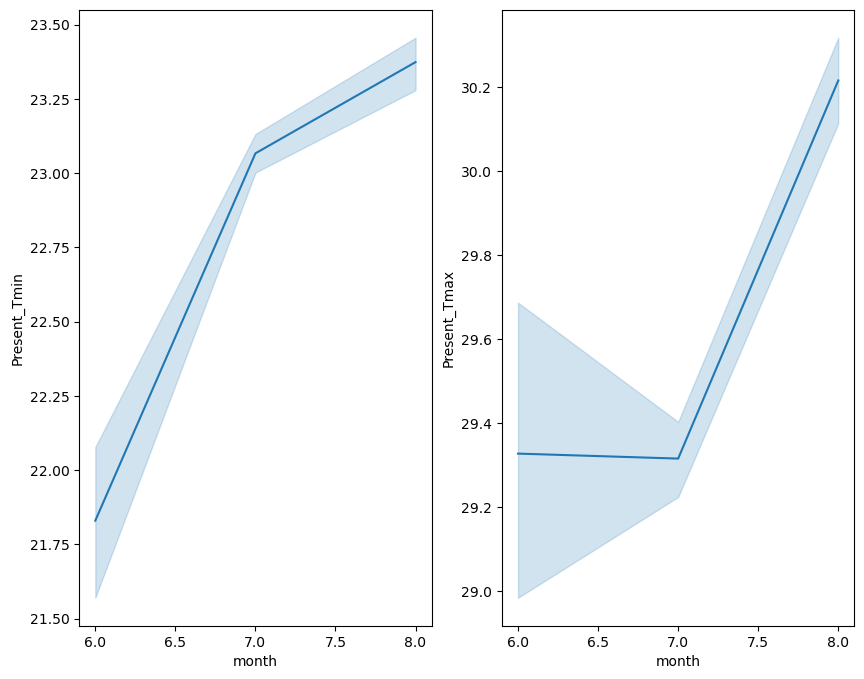

In [36]:
plt.figure(figsize=(10,8))
plotnum = 1
cols=['Present_Tmin','Present_Tmax']
for i in cols :
    if plotnum <=2 :
        ax = plt.subplot(1,2,plotnum)
        sns.lineplot(x=df['month'] , y=df[i])
        plt.xlabel('month')
        plt.ylabel(i)
    plotnum +=1
plt.show()    

- August is the hottest month over all years
- june is the coolest

min of next-day minimum relative humidity is  19.79466629  %
max of next-day minimum relative humidity is  98.5247345  %
min of next-day maximum relative humidity is  58.93628311  %
max of next-day maximum relative humidity is  100.0001526  %


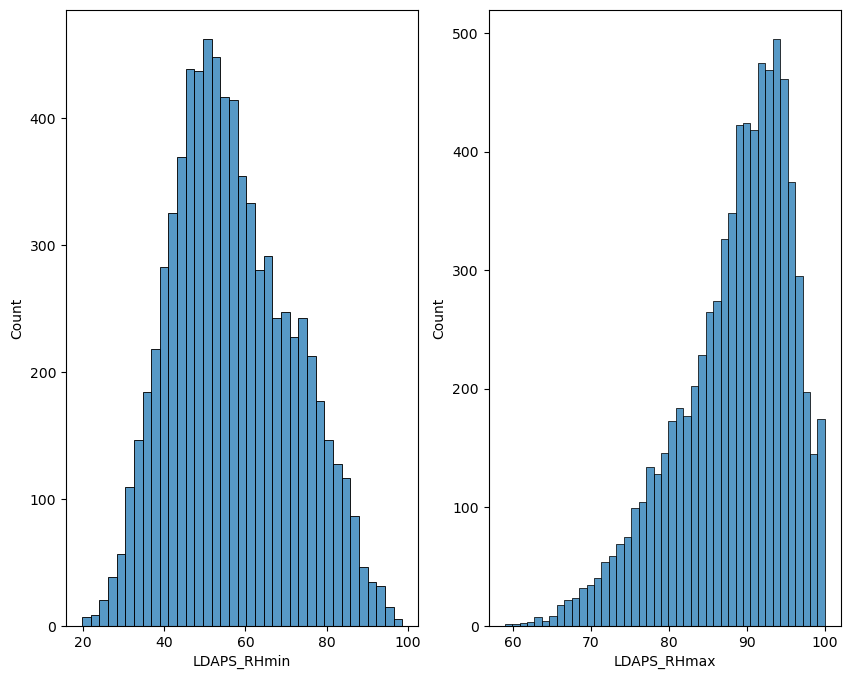

In [37]:
print('min of next-day minimum relative humidity is ',df['LDAPS_RHmin'].min(),' %')
print('max of next-day minimum relative humidity is ',df['LDAPS_RHmin'].max(),' %')
print('min of next-day maximum relative humidity is ',df['LDAPS_RHmax'].min(),' %')
print('max of next-day maximum relative humidity is ',df['LDAPS_RHmax'].max(),' %')
plt.figure(figsize=(10,8))
plotnum = 1
cols=['LDAPS_RHmin', 'LDAPS_RHmax']
for i in cols :
    if plotnum <=2 :
        ax = plt.subplot(1,2,plotnum)
        sns.histplot(x=df[i])
        plt.xlabel(i)
    plotnum +=1
plt.show()    

- -next-day minimum relative humidity is skewed to tight
- next-day maximum relative humidity is skewed to left
- minimum relative humidity is lower than 20 %
- maximum relative humadity is between 98 and 100 %

min of next-day minimum air temperature is  14.27264631 Â°C
max of next-day minimum air temperature is  29.61934244  Â°C
min of next-day maximum air temperature is  17.62495378  Â°C
max of next-day maximum air temperature is  38.54225522  Â°C


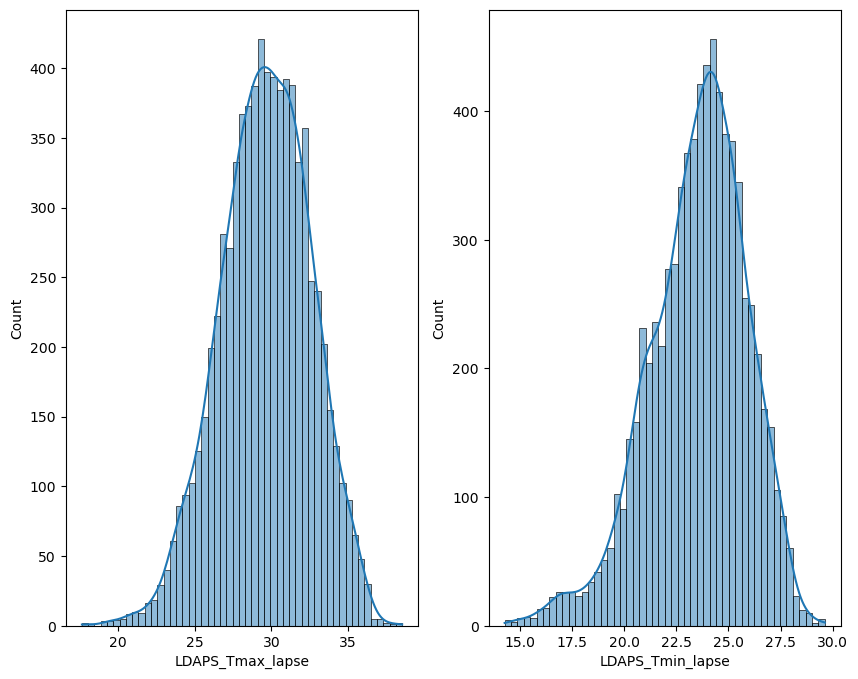

In [38]:
print('min of next-day minimum air temperature is ',df['LDAPS_Tmin_lapse'].min(),'Â°C')
print('max of next-day minimum air temperature is ',df['LDAPS_Tmin_lapse'].max(),' Â°C')
print('min of next-day maximum air temperature is ',df['LDAPS_Tmax_lapse'].min(),' Â°C')
print('max of next-day maximum air temperature is ',df['LDAPS_Tmax_lapse'].max(),' Â°C')
plt.figure(figsize=(10,8))
plotnum = 1
cols=['LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse']
for i in cols :
    if plotnum <=2 :
        ax = plt.subplot(1,2,plotnum)
        sns.histplot(x=df[i] , kde=True)
        plt.xlabel(i)
    plotnum +=1
plt.show()    

- 'LDAPS_Tmax_lapse' is normally distributed
- 'LDAPS_Tmin_lapse' is skewed to left
- most of next-day minimum air temperature applied lapse rate are in range between 25.0 to 27.5 
- most of next-day maximum air temperature applied lapse rate are in range between 29.0 to 35.0

# Checking for outliers

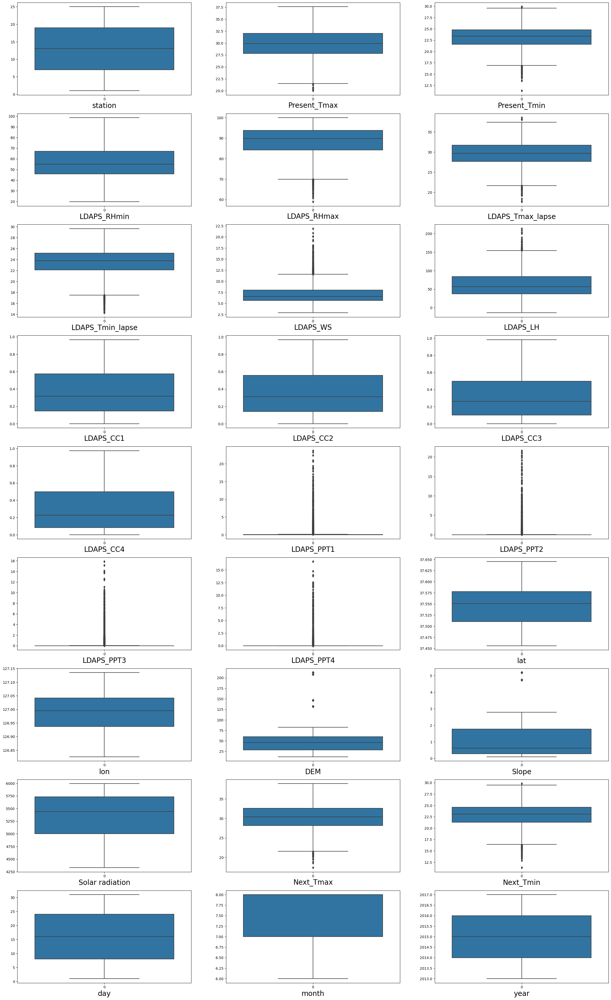

In [39]:
plt.figure(figsize=(30,50))
plotnum = 1
for i in df.columns :
    if plotnum <= 27 :
        ax = plt.subplot(9,3,plotnum)
        sns.boxplot(df[i])
        plt.xlabel(i , fontsize=20)
    plotnum += 1
plt.show()    

some columns have utliers so we will remove them

In [40]:
#using zscore method
from scipy.stats import zscore

In [41]:
outliers = df[['Present_Tmax', 'Present_Tmin','LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse','LDAPS_WS', 'LDAPS_LH','LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4','DEM', 'Slope','Next_Tmax', 'Next_Tmin']]
z = np.abs(zscore(outliers))

In [42]:
df1 = df[(z<3).all(axis=1)]
df1.shape

(6739, 27)

In [43]:
print('percentage of loss is ',((df.shape[0]-df1.shape[0])/df.shape[0])*100,' %')

percentage of loss is  11.188719030047443  %


In [44]:
#use IQR method
out = df[['Present_Tmax', 'Present_Tmin','LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse','LDAPS_WS', 'LDAPS_LH','LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4','DEM', 'Slope','Next_Tmax', 'Next_Tmin']]

q1 = out.quantile(0.25)
q3 = out.quantile(0.75)
IQR = q3 - q1
df2= df[~((df <(q1 - 1.5*IQR)) | (df>(q3 + 1.5*IQR))).any(axis=1)]
df2.shape

(3165, 27)

In [45]:
print('percentage of loss is ',((df.shape[0]-df2.shape[0])/df.shape[0])*100,' %')

percentage of loss is  58.28940432261466  %


zscore is the best method as in IQR we lost more than half of our data which affects our model accuracy and prediction

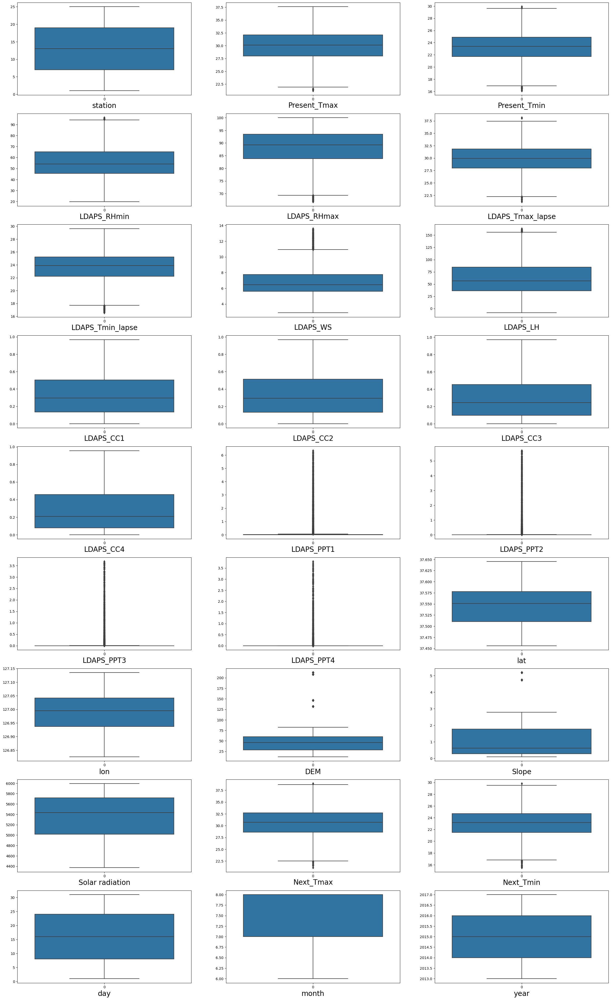

In [46]:
plt.figure(figsize=(30,50))
plotnum = 1
for i in df1.columns :
    if plotnum <= 27 :
        ax = plt.subplot(9,3,plotnum)
        sns.boxplot(df1[i])
        plt.xlabel(i , fontsize=20)
    plotnum += 1
plt.show()    

we reduced outliers as we could

# skewness

In [47]:
df1.skew()

station            -0.001594
Present_Tmax       -0.269936
Present_Tmin       -0.221250
LDAPS_RHmin         0.309567
LDAPS_RHmax        -0.686083
LDAPS_Tmax_lapse   -0.110563
LDAPS_Tmin_lapse   -0.379269
LDAPS_WS            1.085685
LDAPS_LH            0.567050
LDAPS_CC1           0.594835
LDAPS_CC2           0.505774
LDAPS_CC3           0.701288
LDAPS_CC4           0.708754
LDAPS_PPT1          3.724580
LDAPS_PPT2          4.854967
LDAPS_PPT3          5.516862
LDAPS_PPT4          5.924324
lat                 0.106983
lon                -0.277547
DEM                 1.764698
Slope               1.590130
Solar radiation    -0.520157
Next_Tmax          -0.267526
Next_Tmin          -0.234328
day                 0.000057
month              -0.168571
year                0.025066
dtype: float64

we will remove skewness of columns with continuous data 'LDAPS_RHmax' ,'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4','DEM','Slope','Solar radiation'

we prefer to use method yeo-johnson as we have negative and positive skews and some of them are > 1

In [48]:
from sklearn.preprocessing import PowerTransformer

In [49]:
power = PowerTransformer(method='yeo-johnson')
cols = ['LDAPS_RHmax' ,'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4','DEM','Slope','Solar radiation']
df1[cols] = power.fit_transform(df1[cols].values)

In [50]:
#now let us check skewness again
df1.skew()

station            -0.001594
Present_Tmax       -0.269936
Present_Tmin       -0.221250
LDAPS_RHmin         0.309567
LDAPS_RHmax        -0.103320
LDAPS_Tmax_lapse   -0.110563
LDAPS_Tmin_lapse   -0.379269
LDAPS_WS            0.007615
LDAPS_LH           -0.030736
LDAPS_CC1           0.065308
LDAPS_CC2           0.050023
LDAPS_CC3           0.094449
LDAPS_CC4           0.142061
LDAPS_PPT1          1.617538
LDAPS_PPT2          1.820237
LDAPS_PPT3          1.995359
LDAPS_PPT4          2.267954
lat                 0.106983
lon                -0.277547
DEM                 0.038830
Slope               0.233799
Solar radiation    -0.172156
Next_Tmax          -0.267526
Next_Tmin          -0.234328
day                 0.000057
month              -0.168571
year                0.025066
dtype: float64

- all skewnesses look good between range -0.55 and +0.55 except columns 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4' we reduced them as we could as lots of data values are lower than zero which made it hard to detect outliers as we visualized above

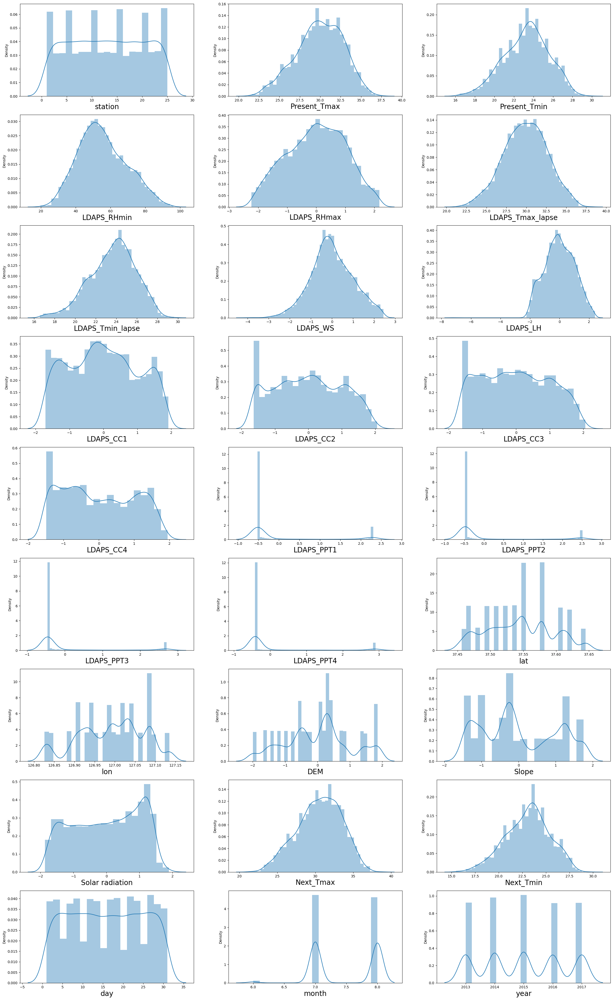

In [51]:
plt.figure(figsize=(30,50))
plotnum = 1
for i in df1.columns :
    if plotnum <= 27 :
        ax = plt.subplot(9,3,plotnum)
        sns.distplot(df1[i])
        plt.xlabel(i , fontsize=20)
    plotnum += 1
plt.show()    

skewness of columns look good and normally distributed

# correlation

In [52]:
df1.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,day,month,year
station,1.000000,0.110291,0.133638,-0.069582,-0.182354,0.066863,0.104401,0.030231,-0.135717,0.011902,...,-0.241811,-0.122829,-0.326019,-0.146034,-0.034787,0.106378,0.129110,0.005032,0.011380,0.006658
Present_Tmax,0.110291,1.000000,0.610428,-0.154266,-0.320074,0.540680,0.616886,-0.071596,0.119022,-0.286862,...,-0.052041,0.011132,-0.130892,-0.092409,-0.099696,0.586943,0.615950,-0.130708,0.169326,0.099185
Present_Tmin,0.133638,0.610428,1.000000,0.151385,-0.053421,0.441577,0.764258,0.034364,-0.008556,0.104457,...,-0.072707,-0.043201,-0.238916,-0.157839,-0.047145,0.438813,0.785946,-0.082712,0.106547,0.099222
LDAPS_RHmin,-0.069582,-0.154266,0.151385,1.000000,0.566069,-0.555583,0.129481,0.171684,-0.002412,0.580343,...,0.090054,-0.093969,0.057460,0.083910,0.229070,-0.433872,0.134518,-0.073118,-0.179437,0.001709
LDAPS_RHmax,-0.182354,-0.320074,-0.053421,0.566069,1.000000,-0.403634,-0.163219,0.060965,0.285942,0.415436,...,0.232258,0.013059,0.174176,0.209222,0.154031,-0.323446,-0.110402,-0.014136,-0.131920,-0.146019
LDAPS_Tmax_lapse,0.066863,0.540680,0.441577,-0.555583,-0.403634,1.000000,0.621299,-0.154400,0.005878,-0.404350,...,-0.038285,0.106354,-0.110286,-0.105094,-0.034699,0.816861,0.553227,-0.139339,0.116760,0.066794
LDAPS_Tmin_lapse,0.104401,0.616886,0.764258,0.129481,-0.163219,0.621299,1.000000,-0.011333,-0.141554,0.074850,...,-0.090587,-0.024177,-0.169881,-0.156322,0.031865,0.546479,0.875382,-0.141725,0.062899,0.050935
LDAPS_WS,0.030231,-0.071596,0.034364,0.171684,0.060965,-0.154400,-0.011333,1.000000,-0.056362,0.189345,...,-0.027463,-0.077686,0.113157,0.095385,0.164626,-0.205979,0.023330,-0.058922,-0.128725,-0.119526
LDAPS_LH,-0.135717,0.119022,-0.008556,-0.002412,0.285942,0.005878,-0.141554,-0.056362,1.000000,-0.130020,...,0.100486,0.009790,0.053275,0.069892,-0.032027,0.151784,-0.052365,-0.021563,0.046641,0.054981
LDAPS_CC1,0.011902,-0.286862,0.104457,0.580343,0.415436,-0.404350,0.074850,0.189345,-0.130020,1.000000,...,-0.014977,-0.016127,-0.031579,-0.034505,0.224341,-0.430392,0.043682,-0.052515,-0.204988,-0.066940


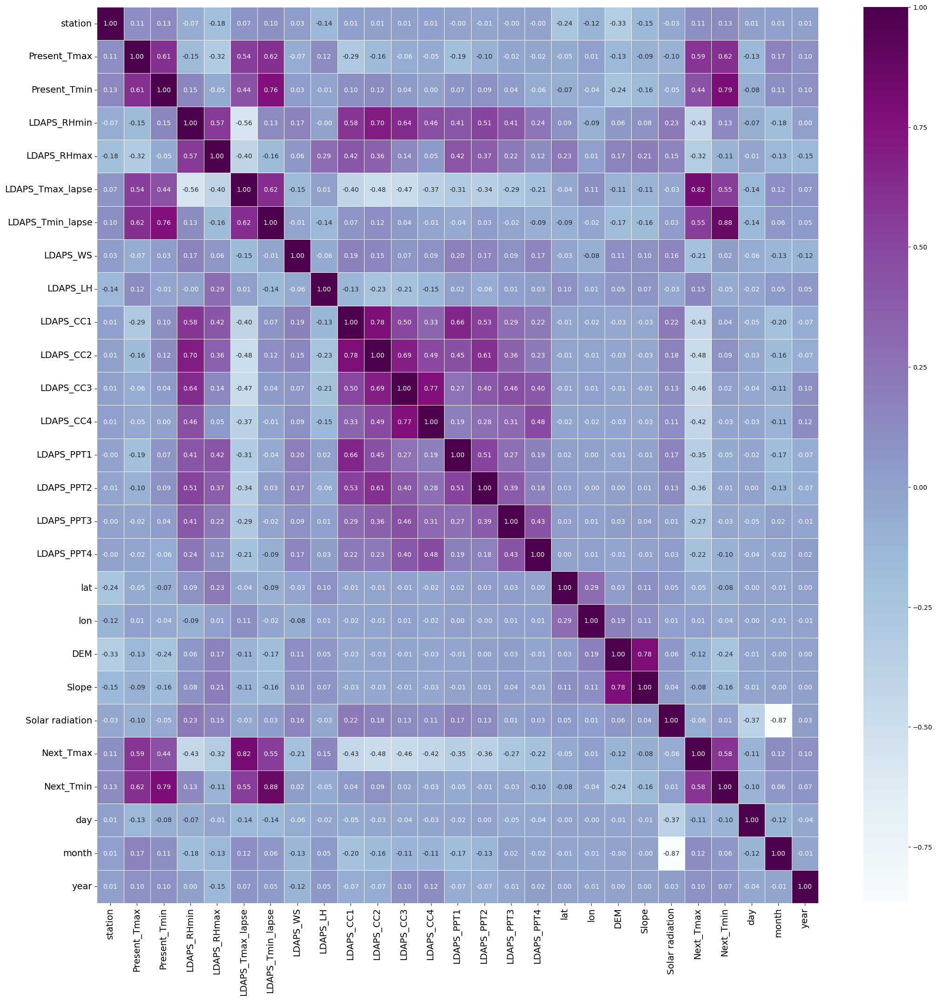

In [53]:
plt.figure(figsize=(25,25))
sns.heatmap(df1.corr() ,annot=True , cmap='BuPu' , linewidth=0.5 ,fmt='.2f')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

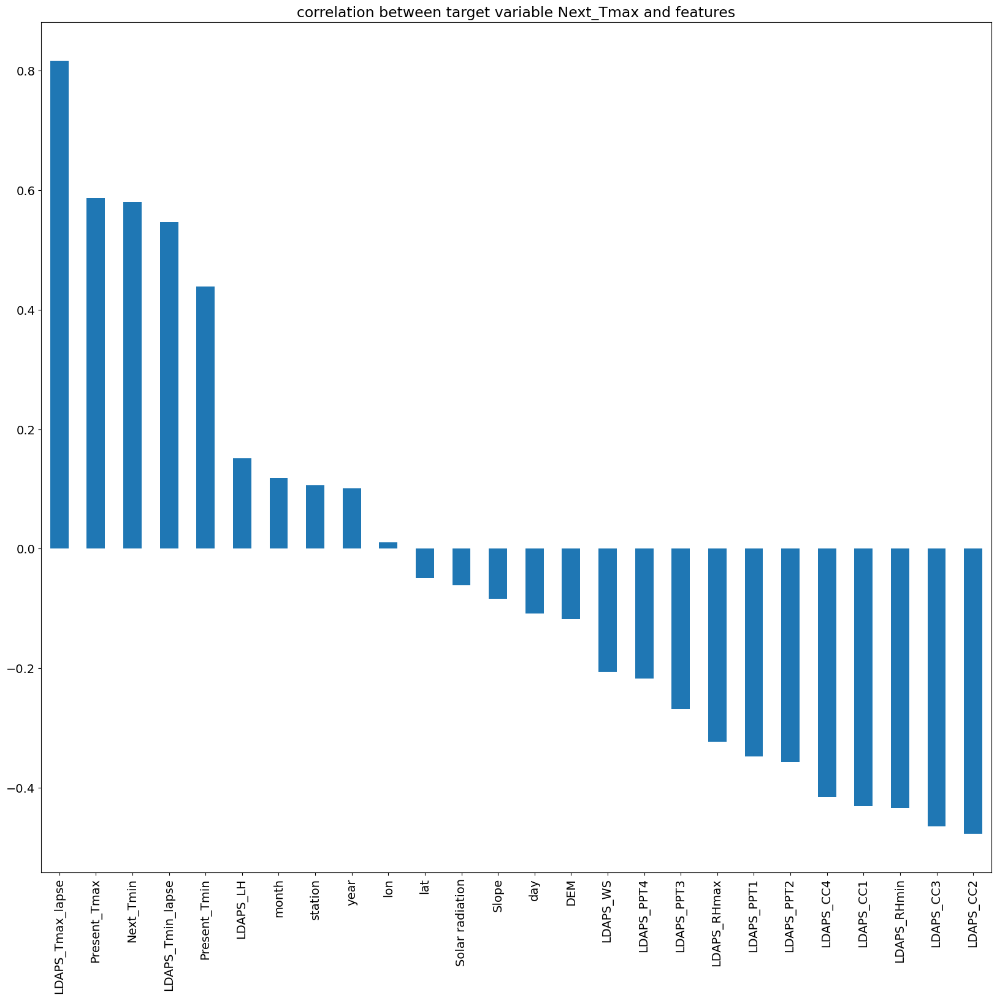

In [54]:
plt.figure(figsize=(20,18))
df1.corr()['Next_Tmax'].sort_values(ascending=False).drop('Next_Tmax').plot(kind='bar')
plt.title('correlation between target variable Next_Tmax and features' , fontsize=17)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

- next-day maximum air temperature applied lapse rate is the highest positivel correlated feature with target variable Next_Tmax
- next-day 2nd 6-hour split average cloud cover is the highest negatively correlated feature with target variable Next_Tmax

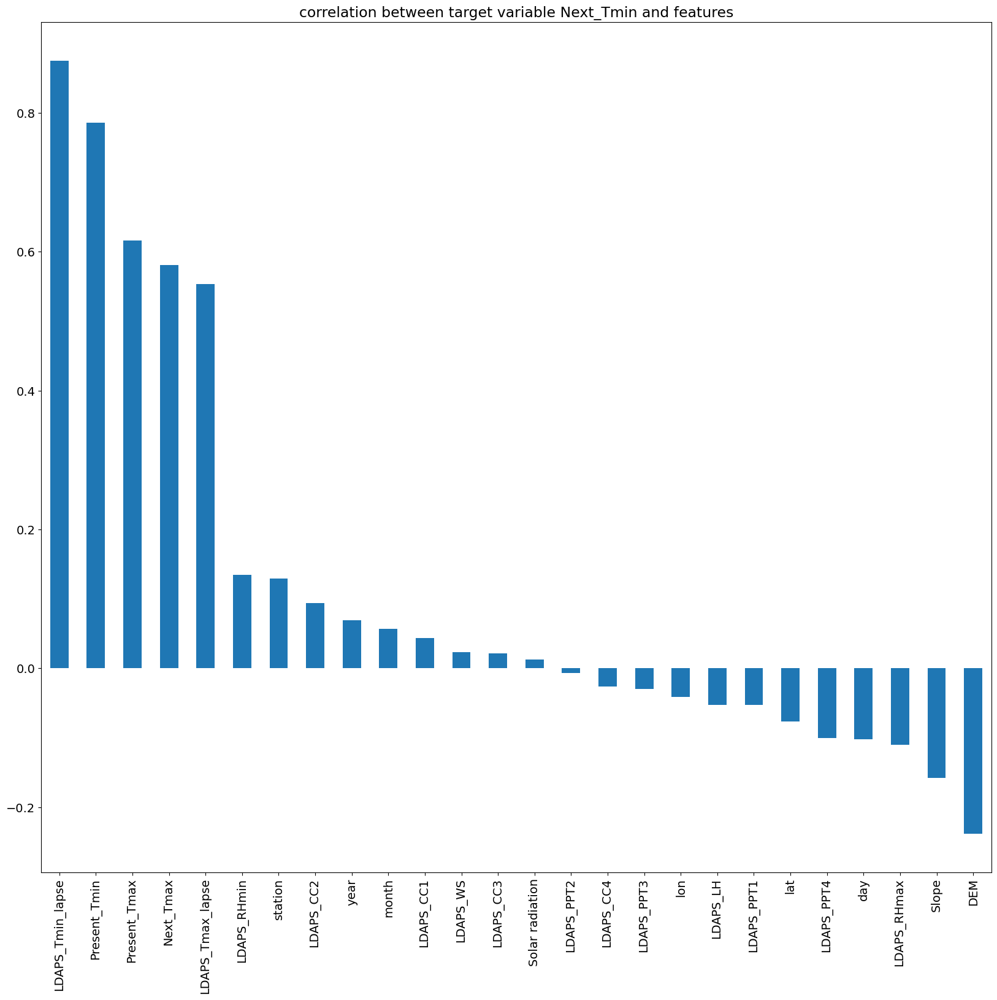

In [55]:
plt.figure(figsize=(20,18))
df1.corr()['Next_Tmin'].sort_values(ascending=False).drop('Next_Tmin').plot(kind='bar')
plt.title('correlation between target variable Next_Tmin and features' , fontsize=17)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

- next-day minimum air temperature applied lapse rate is the highest positivel correlated feature with target variable Next_Tmin
- cloud average is poorely correlated with cloud cover average

# Building model for target variable Next_Tmax :-

# scaling features

In [56]:
x1 = df1.drop('Next_Tmax' , axis=1)
y1 = df1['Next_Tmax']

In [57]:
print('shape of features is',x1.shape)
print('shape of label is ',y1.shape)

shape of features is (6739, 26)
shape of label is  (6739,)


In [58]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [59]:
x_scaler = scaler.fit_transform(x1)
x_scaled = pd.DataFrame(x_scaler , columns = x1.columns)
x_scaled

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,day,month,year
0,-1.672719,-0.425704,-0.814460,0.195915,0.348222,-0.662498,-0.289928,0.176871,0.349992,-0.307447,...,-0.414444,1.211166,0.002925,1.854393,1.327776,1.891687,-0.790587,1.589342,-2.806491,-1.421473
1,-1.533959,0.690215,-0.727785,-0.236604,0.261118,-0.016693,0.171379,-0.574617,-0.166810,-0.348674,...,-0.414444,1.211166,0.518733,0.069704,-0.375858,1.431077,-0.239151,1.589342,-2.806491,-1.421473
2,-1.395198,0.585598,0.008945,-0.494494,-0.717348,0.070769,0.409475,-0.252083,-1.378337,-0.429256,...,-0.414444,0.671467,0.845830,-0.353433,-0.944115,1.410511,0.354704,1.589342,-2.806491,-1.421473
3,-1.256438,0.725088,0.052282,0.194767,1.375094,-0.069787,-0.146681,-0.606795,0.245926,-0.393954,...,-0.414444,2.018714,0.392926,0.098766,1.249133,1.387059,0.524376,1.589342,-2.806491,-1.421473
4,-1.117678,0.515853,-0.597774,0.045667,0.186035,-0.284509,-0.074752,-0.541825,1.298111,-0.736780,...,-0.414444,0.133768,1.814542,-0.278815,-0.392364,1.396254,-0.239151,1.589342,-2.806491,-1.421473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6734,1.102482,-2.378563,-2.374595,-2.226900,-1.363447,-0.757521,-2.400625,0.048293,-2.013062,-1.337812,...,-0.414444,0.133768,0.619378,-0.712912,-0.269357,-1.763704,-2.275223,1.589342,1.002379,1.442938
6735,1.241243,-2.587798,-2.547943,-1.836710,-0.753410,-1.160213,-2.620034,-0.516916,0.685720,-1.248452,...,-0.414444,-0.675779,1.198089,-0.999559,-1.353609,-1.781247,-2.529732,1.589342,1.002379,1.442938
6736,1.380003,-2.308818,-2.677955,-2.078766,-1.302260,-1.288468,-2.188536,-0.244791,0.421213,-1.493884,...,-0.414444,-0.136081,-1.255142,-1.576584,-1.278502,-1.779394,-2.105550,1.589342,1.002379,1.442938
6737,1.518763,-2.308818,-2.417932,-2.273699,-1.457152,-1.049238,-2.207453,0.011101,-0.319269,-1.453370,...,-0.414444,-0.405930,-1.028689,-1.397502,-1.069018,-1.785446,-1.808623,1.589342,1.002379,1.442938


# check for variance inflation factor

In [60]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [61]:
vif = pd.DataFrame()
vif['variance inflation factor'] = [variance_inflation_factor(x_scaled.values ,i) for i in range(len(x_scaled.columns))]
vif['columns'] = x_scaled.columns
vif

,variance inflation factor,columns
0,1.307125,station
1,2.965584,Present_Tmax
2,3.397119,Present_Tmin
3,6.132562,LDAPS_RHmin
4,2.597145,LDAPS_RHmax
5,7.040423,LDAPS_Tmax_lapse
6,8.811891,LDAPS_Tmin_lapse
7,1.232176,LDAPS_WS
8,1.500163,LDAPS_LH
9,4.430759,LDAPS_CC1


- there are multicollinearity issue so we will drop the highest vif
- solar radiation and month are poorely correlated with Next_Tmax so we will drop them

In [62]:
# we will remove month and solar radiation
x_scaled.drop(['month','Solar radiation'],axis=1 , inplace=True)

In [63]:
#now recalcualte vif
vif = pd.DataFrame()
vif['variance inflation factor'] = [variance_inflation_factor(x_scaled.values ,i) for i in range(len(x_scaled.columns))]
vif['columns'] = x_scaled.columns
vif

,variance inflation factor,columns
0,1.290577,station
1,2.859988,Present_Tmax
2,3.320405,Present_Tmin
3,5.880137,LDAPS_RHmin
4,2.597026,LDAPS_RHmax
5,6.731602,LDAPS_Tmax_lapse
6,8.730544,LDAPS_Tmin_lapse
7,1.204280,LDAPS_WS
8,1.495423,LDAPS_LH
9,4.392301,LDAPS_CC1


we have solved multicollinearity problem

# Building model

In [69]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error , mean_squared_error , r2_score

from sklearn.ensemble import RandomForestRegressor , GradientBoostingRegressor , ExtraTreesRegressor , AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Lasso , Ridge
from sklearn.svm import SVR

In [74]:
accuracy = []
stats = []
lr = LinearRegression()
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x_scaled , y1 , test_size=0.3 ,random_state=i)
    lr.fit(x_train,y_train)
    y_pred = lr.predict(x_test)
    acc = r2_score(y_test,y_pred)
    accuracy.append(acc)
    stats.append(i)

In [75]:
myaccuracy=pd.DataFrame()
myaccuracy['accuracy'] = accuracy
myaccuracy['no of states'] = stats
myaccuracy[myaccuracy['no of states'] == myaccuracy['no of states'].max()]

,accuracy,no of states
198,0.798901,199


the best accuracy is 79.89 % when no.of states is 199

In [76]:
x_train,x_test,y_train,y_test = train_test_split(x_scaled , y1 , test_size=0.3 ,random_state=199)


In [77]:
rfr = RandomForestRegressor()
gbr = GradientBoostingRegressor()
et = ExtraTreesRegressor()
dtr = DecisionTreeRegressor()
knn = KNeighborsRegressor()
las = Lasso()
ri = Ridge()
svr = SVR()
ada = AdaBoostRegressor()

In [79]:
models = {'LinearRegression':lr ,'RandomForestRegressor':rfr ,'GradientBoostingRegressor':gbr ,
        'ExtraTreesRegressor':et , 'DecisionTreeRegressor':dtr ,
          'KNeighborsRegressor':knn , 'Lasso':las , 'Ridge':ri ,'SVR':svr ,'AdaBoostRegresso':ada  }
for name , m in models.items():
    m.fit(x_train,y_train)
    pred_train = m.predict(x_train)
    pred_test = m.predict(x_test)
    accuracy_test = r2_score(y_test , pred_test)
    accuracy_train = r2_score(y_train , pred_train)
    print('model is ',name)
    print('accuracy of test model is ','{:.2f}'.format(accuracy_test*100),' %')
    print('accuracy of train model is ','{:.2f}'.format(accuracy_train*100),' %')
    print('mean absolute error: ',mean_absolute_error(y_test,pred_test))
    print('mean squared error: ',mean_squared_error(y_test,pred_test))
    print('root mean squared error: ',np.sqrt(mean_squared_error(y_test,pred_test)))
    print('\n')

model is  LinearRegression
accuracy of test model is  79.89  %
accuracy of train model is  77.80  %
mean absolute error:  1.029008477758336
mean squared error:  1.7859824701528755
root mean squared error:  1.33640655122342


model is  RandomForestRegressor
accuracy of test model is  89.96  %
accuracy of train model is  98.48  %
mean absolute error:  0.701035113748763
mean squared error:  0.891905666172106
root mean squared error:  0.9444075741818815


model is  GradientBoostingRegressor
accuracy of test model is  85.68  %
accuracy of train model is  88.15  %
mean absolute error:  0.869417358587723
mean squared error:  1.2717999734689083
root mean squared error:  1.1277410932784653


model is  ExtraTreesRegressor
accuracy of test model is  92.30  %
accuracy of train model is  100.00  %
mean absolute error:  0.6172314540059346
mean squared error:  0.6837360267062309
root mean squared error:  0.8268833210956857


model is  DecisionTreeRegressor
accuracy of test model is  75.55  %
accuracy

ExtraTreesRegressor has the best accuracy

# cross validation score

In [80]:
from sklearn.model_selection import cross_val_score

In [83]:
models = {'LinearRegression':lr ,'RandomForestRegressor':rfr ,'GradientBoostingRegressor':gbr ,
        'ExtraTreesRegressor':et , 'DecisionTreeRegressor':dtr ,
          'KNeighborsRegressor':knn , 'Lasso':las , 'Ridge':ri ,'SVR':svr ,'AdaBoostRegresso':ada  }
for name , m in models.items():
    score = cross_val_score(m,x_scaled , y1 ,cv=5)
    mean = score.mean()
    print('model is ',name)
    print('score is ',score)
    print('mean is ',mean)
    print('Difference between r2 score and mean score is ',r2_score(y_test,m.predict(x_test)) - mean)
    print('\n')

model is  LinearRegression
score is  [0.7301094  0.66284872 0.70304305 0.76084527 0.56872255]
mean is  0.685113798996664
Difference between r2 score and mean score is  0.11378673303625031


model is  RandomForestRegressor
score is  [0.74372634 0.65942343 0.67190177 0.73768505 0.61241278]
mean is  0.6850298739918265
Difference between r2 score and mean score is  0.21454262577146255


model is  GradientBoostingRegressor
score is  [0.75867888 0.64316708 0.71793447 0.76725215 0.63931472]
mean is  0.7052694591860199
Difference between r2 score and mean score is  0.15152740063799686


model is  ExtraTreesRegressor
score is  [0.74710476 0.64532336 0.71747467 0.77591444 0.59701671]
mean is  0.6965667873896064
Difference between r2 score and mean score is  0.2264453622264071


model is  DecisionTreeRegressor
score is  [0.39463511 0.4141212  0.40583678 0.56622402 0.43931865]
mean is  0.4440271507076846
Difference between r2 score and mean score is  0.31149481127628686


model is  KNeighborsRegre

I would predfer to use ExtraTreesRegressor as it is the best accuracy and the difference between r2 score and mean score is not that too high

# HyperParameter

In [84]:
from sklearn.model_selection import GridSearchCV

In [103]:
params = {'max_depth':[10,20,30] ,'n_estimators' :[100,150,200]}

In [104]:
gsv = GridSearchCV(ExtraTreesRegressor() , params)
gsv.fit(x_train , y_train)

GridSearchCV(estimator=ExtraTreesRegressor(),
             param_grid={'max_depth': [10, 20, 30],
                         'n_estimators': [100, 150, 200]})

In [105]:
gsv.best_params_

{'max_depth': 20, 'n_estimators': 200}

In [106]:
best_ext = ExtraTreesRegressor(max_depth= 20, n_estimators= 200)
best_ext.fit(x_train , y_train)

pred_test = best_ext.predict(x_test)
pred_train = best_ext.predict(x_train)
accuracy_test = r2_score(y_test , pred_test)
accuracy_train = r2_score(y_train , pred_train)
print('accuracy of test model is ','{:.2f}'.format(accuracy_test*100),' %')
print('accuracy of train model is ','{:.2f}'.format(accuracy_train*100),' %')
print('mean absolute error: ',mean_absolute_error(y_test,pred_test))
print('mean squared error: ',mean_squared_error(y_test,pred_test))
print('root mean squared error: ',np.sqrt(mean_squared_error(y_test,pred_test)))

accuracy of test model is  92.44  %
accuracy of train model is  99.99  %
mean absolute error:  0.61635353589859
mean squared error:  0.6715120819527284
root mean squared error:  0.8194584077015309


- we imporoved accuracy test model from 92.30 % to 92.44 % 
- accuracy is so high and satisfying

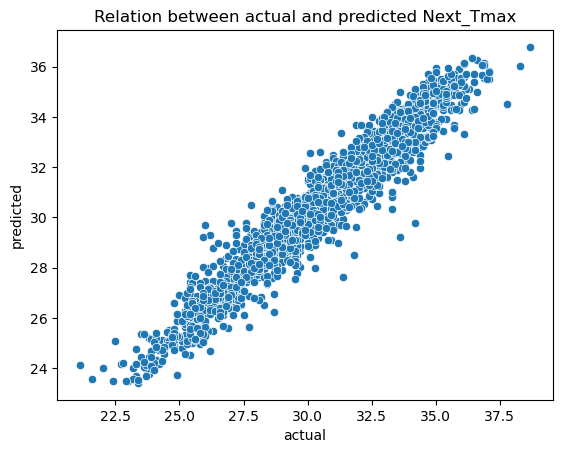

In [108]:
sns.scatterplot(x= y_test , y= pred_test)
plt.title('Relation between actual and predicted Next_Tmax')
plt.xlabel('actual')
plt.ylabel('predicted')
plt.show()

There is a strong positivel correlation between actual and predicted values

# prediction

In [111]:
mydata = pd.DataFrame()
mydata['actual next maximum temperature'] = y_test
mydata['predicted next maximum temperature'] = pred_test
mydata

,actual next maximum temperature,predicted next maximum temperature
6941,31.8,31.705421
5560,35.3,35.187737
201,27.1,27.249500
2944,28.1,26.726500
4043,34.7,35.113417
...,...,...
6448,26.6,26.091632
6045,32.5,32.442998
5909,35.5,32.433470
497,31.2,31.407758


# Building model for target variable Next_Tmin :-

In [113]:
x2 = df1.drop('Next_Tmin' , axis =1)
y2 = df1['Next_Tmin']

In [114]:
print('shape of features is',x2.shape)
print('shape of label is ',y2.shape)

shape of features is (6739, 26)
shape of label is  (6739,)


In [117]:
s_scaler = scaler.fit_transform(x2)
s_scaled = pd.DataFrame(x_scaler , columns = x2.columns)
s_scaled

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,day,month,year
0,-1.672719,-0.425704,-0.814460,0.195915,0.348222,-0.662498,-0.289928,0.176871,0.349992,-0.307447,...,-0.414444,1.211166,0.002925,1.854393,1.327776,1.891687,-0.790587,1.589342,-2.806491,-1.421473
1,-1.533959,0.690215,-0.727785,-0.236604,0.261118,-0.016693,0.171379,-0.574617,-0.166810,-0.348674,...,-0.414444,1.211166,0.518733,0.069704,-0.375858,1.431077,-0.239151,1.589342,-2.806491,-1.421473
2,-1.395198,0.585598,0.008945,-0.494494,-0.717348,0.070769,0.409475,-0.252083,-1.378337,-0.429256,...,-0.414444,0.671467,0.845830,-0.353433,-0.944115,1.410511,0.354704,1.589342,-2.806491,-1.421473
3,-1.256438,0.725088,0.052282,0.194767,1.375094,-0.069787,-0.146681,-0.606795,0.245926,-0.393954,...,-0.414444,2.018714,0.392926,0.098766,1.249133,1.387059,0.524376,1.589342,-2.806491,-1.421473
4,-1.117678,0.515853,-0.597774,0.045667,0.186035,-0.284509,-0.074752,-0.541825,1.298111,-0.736780,...,-0.414444,0.133768,1.814542,-0.278815,-0.392364,1.396254,-0.239151,1.589342,-2.806491,-1.421473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6734,1.102482,-2.378563,-2.374595,-2.226900,-1.363447,-0.757521,-2.400625,0.048293,-2.013062,-1.337812,...,-0.414444,0.133768,0.619378,-0.712912,-0.269357,-1.763704,-2.275223,1.589342,1.002379,1.442938
6735,1.241243,-2.587798,-2.547943,-1.836710,-0.753410,-1.160213,-2.620034,-0.516916,0.685720,-1.248452,...,-0.414444,-0.675779,1.198089,-0.999559,-1.353609,-1.781247,-2.529732,1.589342,1.002379,1.442938
6736,1.380003,-2.308818,-2.677955,-2.078766,-1.302260,-1.288468,-2.188536,-0.244791,0.421213,-1.493884,...,-0.414444,-0.136081,-1.255142,-1.576584,-1.278502,-1.779394,-2.105550,1.589342,1.002379,1.442938
6737,1.518763,-2.308818,-2.417932,-2.273699,-1.457152,-1.049238,-2.207453,0.011101,-0.319269,-1.453370,...,-0.414444,-0.405930,-1.028689,-1.397502,-1.069018,-1.785446,-1.808623,1.589342,1.002379,1.442938


# check variance inflation factor

In [119]:
#now recalcualte vif
vif = pd.DataFrame()
vif['variance inflation factor'] = [variance_inflation_factor(s_scaled.values ,i) for i in range(len(s_scaled.columns))]
vif['columns'] = s_scaled.columns
vif

,variance inflation factor,columns
0,1.307125,station
1,2.965584,Present_Tmax
2,3.397119,Present_Tmin
3,6.132562,LDAPS_RHmin
4,2.597145,LDAPS_RHmax
5,7.040423,LDAPS_Tmax_lapse
6,8.811891,LDAPS_Tmin_lapse
7,1.232176,LDAPS_WS
8,1.500163,LDAPS_LH
9,4.430759,LDAPS_CC1


- we have multicollinearity problem so we will delete columns with high vif who are poorly correlated with Next_Tmin
- we will delete Solar radiation , month columns

In [121]:
s_scaled.drop(['month','Solar radiation'],axis=1 , inplace=True)

In [122]:
# now recheck vif
#now recalcualte vif
vif = pd.DataFrame()
vif['variance inflation factor'] = [variance_inflation_factor(s_scaled.values ,i) for i in range(len(s_scaled.columns))]
vif['columns'] = s_scaled.columns
vif

,variance inflation factor,columns
0,1.290577,station
1,2.859988,Present_Tmax
2,3.320405,Present_Tmin
3,5.880137,LDAPS_RHmin
4,2.597026,LDAPS_RHmax
5,6.731602,LDAPS_Tmax_lapse
6,8.730544,LDAPS_Tmin_lapse
7,1.204280,LDAPS_WS
8,1.495423,LDAPS_LH
9,4.392301,LDAPS_CC1


There is no multi collinearity problem

# Building model

In [133]:
accuracy = []
stats = []
lr = LinearRegression()
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(s_scaled , y2 , test_size=0.3 ,random_state=i)
    lr.fit(x_train,y_train)
    y_pred = lr.predict(x_test)
    acc = r2_score(y_test,y_pred)
    accuracy.append(acc)
    stats.append(i)

In [134]:
bestaccuracy=pd.DataFrame()
bestaccuracy['accuracy'] = accuracy
bestaccuracy['no of states'] = stats
bestaccuracy[myaccuracy['no of states'] == bestaccuracy['no of states'].max()]

,accuracy,no of states
198,1.0,199


In [135]:
x_train,x_test,y_train,y_test = train_test_split(s_scaled , y2 , test_size=0.3 ,random_state=199)

In [136]:
models = {'LinearRegression':lr ,'RandomForestRegressor':rfr ,'GradientBoostingRegressor':gbr ,
        'ExtraTreesRegressor':et , 'DecisionTreeRegressor':dtr ,
          'KNeighborsRegressor':knn , 'Lasso':las , 'Ridge':ri ,'SVR':svr ,'AdaBoostRegresso':ada  }
for name , m in models.items():
    m.fit(x_train,y_train)
    pred_train = m.predict(x_train)
    pred_test = m.predict(x_test)
    accuracy_test = r2_score(y_test , pred_test)
    accuracy_train = r2_score(y_train , pred_train)
    print('model is ',name)
    print('accuracy of test model is ','{:.2f}'.format(accuracy_test*100),' %')
    print('accuracy of train model is ','{:.2f}'.format(accuracy_train*100),' %')
    print('mean absolute error: ',mean_absolute_error(y_test,pred_test))
    print('mean squared error: ',mean_squared_error(y_test,pred_test))
    print('root mean squared error: ',np.sqrt(mean_squared_error(y_test,pred_test)))
    print('\n')

model is  LinearRegression
accuracy of test model is  100.00  %
accuracy of train model is  100.00  %
mean absolute error:  4.230927071489419e-15
mean squared error:  2.8810979292166807e-29
root mean squared error:  5.367585983677095e-15


model is  RandomForestRegressor
accuracy of test model is  100.00  %
accuracy of train model is  100.00  %
mean absolute error:  0.001034619188944131
mean squared error:  0.00014394460929773522
root mean squared error:  0.011997691832087338


model is  GradientBoostingRegressor
accuracy of test model is  100.00  %
accuracy of train model is  100.00  %
mean absolute error:  0.004607030368835546
mean squared error:  9.012505511515666e-05
root mean squared error:  0.00949342167583199


model is  ExtraTreesRegressor
accuracy of test model is  100.00  %
accuracy of train model is  100.00  %
mean absolute error:  0.003921859545014266
mean squared error:  0.00017461622156280814
root mean squared error:  0.013214243132423746


model is  DecisionTreeRegressor

In [137]:
models = {'LinearRegression':lr ,'RandomForestRegressor':rfr ,'GradientBoostingRegressor':gbr ,
        'ExtraTreesRegressor':et , 'DecisionTreeRegressor':dtr ,
          'KNeighborsRegressor':knn , 'Lasso':las , 'Ridge':ri ,'SVR':svr ,'AdaBoostRegresso':ada  }
for name , m in models.items():
    score = cross_val_score(m,s_scaled , y2 ,cv=5)
    mean = score.mean()
    print('model is ',name)
    print('score is ',score)
    print('mean is ',mean)
    print('Difference between r2 score and mean score is ',r2_score(y_test,m.predict(x_test)) - mean)
    print('\n')

model is  LinearRegression
score is  [1. 1. 1. 1. 1.]
mean is  1.0
Difference between r2 score and mean score is  0.0


model is  RandomForestRegressor
score is  [0.99999976 0.99961926 0.99998678 0.99997338 0.99997953]
mean is  0.9999117417262798
Difference between r2 score and mean score is  6.281600216595518e-05


model is  GradientBoostingRegressor
score is  [0.99998867 0.99978146 0.99998198 0.99998687 0.99997951]
mean is  0.9999436976034811
Difference between r2 score and mean score is  4.037275429558118e-05


model is  ExtraTreesRegressor
score is  [0.999923   0.99936347 0.99996547 0.99994529 0.99998379]
mean is  0.9998362023758804
Difference between r2 score and mean score is  0.00013293413191628467


model is  DecisionTreeRegressor
score is  [1.         0.99951652 0.99998281 0.99995232 0.99987044]
mean is  0.9998644170703297
Difference between r2 score and mean score is  9.624678061515013e-05


model is  KNeighborsRegressor
score is  [0.63209704 0.6789069  0.79844878 0.81919256 

From above we see all mdel are excellent to use so we can choose any model we desire

In [142]:

lr.fit(x_train , y_train)
pred_test = lr.predict(x_test)
pred_train = lr.predict(x_train)
accuracy_test = r2_score(y_test , pred_test)
accuracy_train = r2_score(y_train , pred_train)
print('accuracy of test model is ','{:.2f}'.format(accuracy_test*100),' %')
print('accuracy of train model is ','{:.2f}'.format(accuracy_train*100),' %')
print('mean absolute error: ',mean_absolute_error(y_test,pred_test))
print('mean squared error: ',mean_squared_error(y_test,pred_test))
print('root mean squared error: ',np.sqrt(mean_squared_error(y_test,pred_test)))

accuracy of test model is  100.00  %
accuracy of train model is  100.00  %
mean absolute error:  4.230927071489419e-15
mean squared error:  2.8810979292166807e-29
root mean squared error:  5.367585983677095e-15


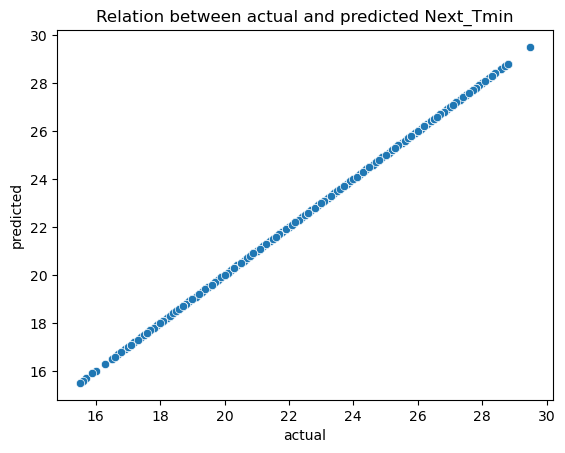

In [143]:
sns.scatterplot(x= y_test , y= pred_test)
plt.title('Relation between actual and predicted Next_Tmin')
plt.xlabel('actual')
plt.ylabel('predicted')
plt.show()

# prediction

In [145]:
mydata = pd.DataFrame()
mydata['actual next minimum temperature'] = y_test
mydata['predicted next minimum temperature'] = pred_test
mydata

,actual next minimum temperature,predicted next minimum temperature
6941,23.1,23.1
5560,25.9,25.9
201,23.1,23.1
2944,23.3,23.3
4043,24.7,24.7
...,...,...
6448,22.6,22.6
6045,24.3,24.3
5909,24.8,24.8
497,25.8,25.8
